# Python meets Fourier

<img src="img/SqWaveAnimation.gif">

You may remember this classic version of the Fourier series of a periodic function $\color{red}{f(t)}$, with period $T$, 
$$
\large
\color{red}{f(t)} = 
\color{blue}{a_0} + 
\sum_{n=1}^\infty \color{blue}{a_n} \,\cos\left(\frac{2 \pi n t}{T}\right) +
\sum_{n=1}^\infty \color{blue}{b_n} \,\sin\left(\frac{2 \pi n t}{T}\right)
$$
where the coefficients $\color{blue}{a_n}$ and $\color{blue}{b_n}$ can be found using
$$
\large
\begin{aligned}
\color{blue}{a_n} &= \frac{1}{T} \int_0^T \, \color{red}{f(t)} \, \cos\left(\frac{2 \pi n t}{T}\right) \, \mathrm{d}x \\
\color{blue}{b_n} &= \frac{1}{T} \int_0^T \, \color{red}{f(t)} \, \sin\left(\frac{2 \pi n t}{T}\right) \, \mathrm{d}x
\end{aligned}
$$

### We are going to investigate the manipulation of the Fourier series of different signals, and take a look (or listen) to the results, but first we must introduce...

## Discrete signals

In reality on computers, we use discrete signals: signals that are sampled at regular intervals.

| Continuous signal | Sampled signal (or "discrete signal") |
|:-:|:-:|
| ![Continuous](img/fig2.1.gif) | ![Sampled](img/fig2.2.gif) |

These discretely sampled signals are just saved as sequences (or arrays) of numbers, often between -1.0 and 1.0, i.e.
```
signal = [0.1, 0.23, 0.34, 0.13, -0.4, -0.46, ...]
```
Each number in the sequnce is known as a __sample__. Typically a sound is sampled at 44,100 Hz, that is we have 44,100 sampled values of the signal PER SECOND of sound. This is known as the __sampling rate__.

# An example: let's load a sound

Our test case is AC/DC's Highway to Hell. (RIP Malcolm Young)

<img src='img/highway.jpg' width=400 align='left'>

In [21]:
%matplotlib inline
# Load our math libraries
import math
import numpy as np
import scipy.fftpack
from scipy import misc
# Load plotting and graphics libraries
import seaborn as sns
import matplotlib.pyplot as plt
# Load sound libraries
import librosa
import librosa.display
import IPython.display as ipd
import pdb

sns.set_style('whitegrid') # Set the plot backgrounds to white

### Now load Highway to Hell

Sample rate of our sound: 44100


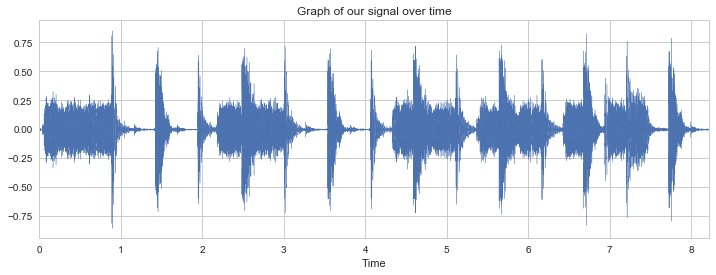

In [22]:
ac_dc, sr = librosa.load('audio/highway.wav', sr=44100)

print('Sample rate of our sound: ' + str(sr))

plt.figure(figsize=(12, 4))
librosa.display.waveplot(ac_dc, sr=sr)
plt.title('Graph of our signal over time')
plt.show()

ipd.Audio(ac_dc, rate=sr)

### And let's look closer at the waveform

N = 362539


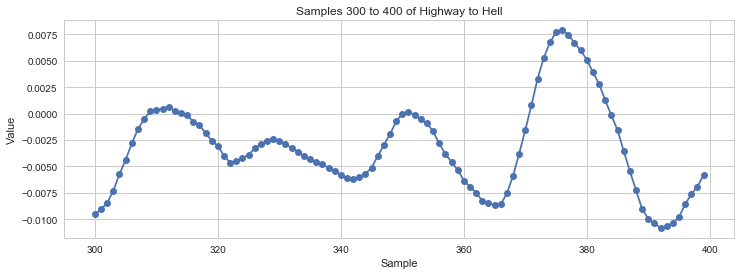

Samples 300 to 320 of Highway to Hell: 

[ -9.52148438e-03  -9.07897949e-03  -8.45336914e-03  -7.29370117e-03
  -5.75256348e-03  -4.37927246e-03  -2.83813477e-03  -1.46484375e-03
  -5.49316406e-04   1.98364258e-04   3.20434570e-04   4.73022461e-04
   6.40869141e-04   1.98364258e-04   7.62939453e-05  -1.67846680e-04
  -7.62939453e-04  -1.11389160e-03  -1.83105469e-03  -2.57873535e-03]


In [25]:
print('N =', len(ac_dc))
plt.figure(figsize=(12, 4))
plt.plot(range(300,400), ac_dc[300:400], marker='o') # ac_dc[0:100] selects the array elements from 0 to 100
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Samples 300 to 400 of Highway to Hell')
plt.show()

print('Samples 300 to 320 of Highway to Hell: \n')
print(ac_dc[300:320])


## A little about arrays in Python

Some excellent features of working with arrays (or vectors if you want to call them that) from the NumPy package. Note that **```np```** is shorthand for **```numpy```**.

**There are lots of useful array creation routines:**

In [26]:
a = np.arange(0, 10)
print('a =', a, '\n')
b = np.linspace(0.0, 1.0, 10, endpoint=False)
print('b =', b, '\n')
c = np.random.random(10)
print('c =', c, '\n')
d = np.sin(2 * math.pi * b)
print('d =', d, '\n')
f = np.ones(10)
print('f =', f)

a = [0 1 2 3 4 5 6 7 8 9] 

b = [ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9] 

c = [ 0.20260176  0.82400763  0.67757263  0.75548857  0.65074398  0.02025699
  0.21975329  0.99073179  0.53553871  0.18780747] 

d = [  0.00000000e+00   5.87785252e-01   9.51056516e-01   9.51056516e-01
   5.87785252e-01   1.22464680e-16  -5.87785252e-01  -9.51056516e-01
  -9.51056516e-01  -5.87785252e-01] 

f = [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


**And you can do basic arithmetic and dot products**

In [27]:
print('a+b =', a+b, '\n')
print('2*b =', 2*b, '\n')
print('dot(f, a) =', f@a)

a+b = [ 0.   1.1  2.2  3.3  4.4  5.5  6.6  7.7  8.8  9.9] 

2*b = [ 0.   0.2  0.4  0.6  0.8  1.   1.2  1.4  1.6  1.8] 

dot(f, a) = 45.0


**Sub-array selection using "slices" and inequalities**

In [28]:
print('a[2:4] =', a[2:4])
print('a[2:7:2] =', a[2:7:2])
print('b[6:2:-1] =', b[6:2:-1])

print('c[(c>0.5) & (c<0.7)] =', c[(c>0.5) & (c<0.7)])

a[2:4] = [2 3]
a[2:7:2] = [2 4 6]
b[6:2:-1] = [ 0.6  0.5  0.4  0.3]
c[(c>0.5) & (c<0.7)] = [ 0.67757263  0.65074398  0.53553871]


**It is easy to set values using slices**

In [29]:
x = np.copy(b)
x[5:8] = a[5:8]
print('b =', b)
print('x =', x, '\n')

y = np.copy(c)
y[3:7] = 0.5
print('c =', c)
print('y =', y)

b = [ 0.   0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9]
x = [ 0.   0.1  0.2  0.3  0.4  5.   6.   7.   0.8  0.9] 

c = [ 0.20260176  0.82400763  0.67757263  0.75548857  0.65074398  0.02025699
  0.21975329  0.99073179  0.53553871  0.18780747]
y = [ 0.20260176  0.82400763  0.67757263  0.5         0.5         0.5         0.5
  0.99073179  0.53553871  0.18780747]


# The discrete Fourier transform (DFT)

Now lets introduce the DFT. Lets call our discretely sampled signal $\large\,\color{red}{f_k}$, where $\color{red}k$ is our integer index from $\color{red}0$ to $\color{red}{N-1}$ (so $N$ is the length of the signal). I.e.

$$
\large
\color{red}{
\text{Signal} = [f_0, f_1, f_2, \ldots, f_{N-1}]
}
$$

The signal can be decomposed much like the Fourier series

Here we again need a __cosine__ element as well as a __sine__ element
$$
\large
\color{red}{f_k} \,=\, \sum_{n=0}^{N-1} \,\color{blue}{a_n} \cos\left(\frac{2 \pi k n}{N} \right) + \sum_{n=0}^{N-1} \color{blue}{b_n} \, \sin\left(\frac{2 \pi k n}{N} \right)
$$
where we calculate the coefficients $\color{blue}{a_n}$ and $\color{blue}{b_n}$ using
$$
\large
\begin{aligned}
\color{blue}{a_n} \,=\, \frac 1 N \sum_{k=0}^{N-1} \, \color{red}{f_k} \, \cos\left(\frac{2 \pi k n}{N} \right) \\
\color{blue}{b_n} \,=\, \frac 1 N \sum_{k=0}^{N-1} \, \color{red}{f_k} \, \sin\left(\frac{2 \pi k n}{N} \right) 
\end{aligned}
$$



In [30]:
def dft(signal):
    # the signal is the f_k
    ft = scipy.fftpack.fft(signal)

    a_n = np.real(ft[:len(ft) // 2 + 1])
    b_n = np.imag(ft[:len(ft) // 2 + 1])
    
    return a_n, b_n
    
def inverse_dft(a_n, b_n):
    cos_c = np.append(a_n, a_n[1:][::-1])
    sin_c = np.append(b_n, -b_n[1:][::-1])
    
    ft = np.vectorize(complex)(cos_c, sin_c)
    
    signal = np.real(scipy.fftpack.ifft(ft))
    return signal

## Lets try applying the DFT and then inverting it...

In [35]:
a_n, b_n = dft(ac_dc)

ac_dc_recon = inverse_dft(a_n, b_n)

ipd.Audio(ac_dc_recon, rate=sr)

## Plotting the DFT

We calculate the "intensity" of the DFT at $n$ with 
$$
\large
\text{Intensity of DFT at }n = \sqrt{a_n^2 + b_n^2}
$$

The index $n$ corresponds to certain physical __frequency__ of sound in Hertz. We can calculate it using

$$
\large
\text{Frequency at $n$ (in Hz)} = \frac{n \times \text{Sample rate} }{\text{Number of samples}}
$$

In [36]:
def plot_dft_by_hz(f, a_n, b_n, lo_hz, hi_hz, log_scale=False):
    
    plt.figure(figsize=(12, 4))
    if log_scale:
        plt.semilogy(f, np.sqrt(a_n**2 + b_n**2), lw=1)
    else:
        plt.plot(f, np.sqrt(a_n**2 + b_n**2), lw=1)
    plt.title(r'Intensity of DFT between {0} Hz and {1} Hz'.format(round(lo_hz), round(hi_hz)))
    plt.xlim([lo_hz, hi_hz])
    plt.xlabel('Frequency (Hz)')
    plt.ylabel(r'Intensity of DFT, $\sqrt{{ a_n^2 + b_n^2 }}$')
    plt.show()

Number of samples N = 362539


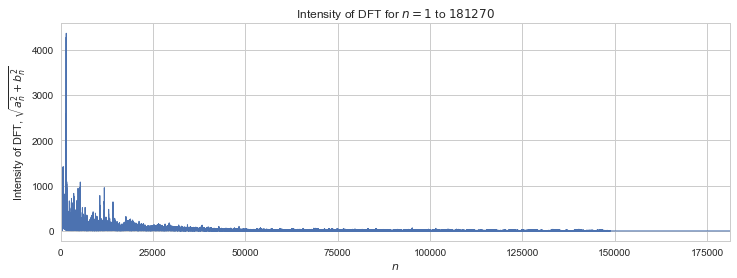

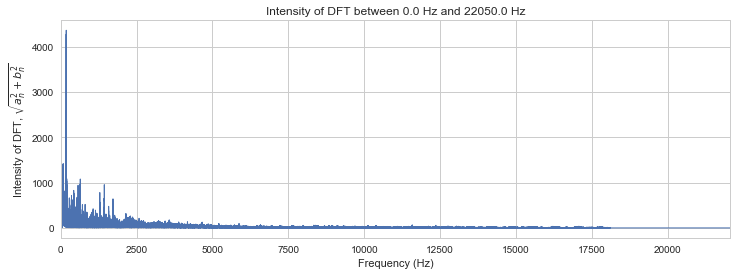

In [37]:
N = len(ac_dc)
print('Number of samples N =', N)
freqs = (sr/2) * np.arange(0.0, 1.0, 2.0/N)

plt.figure(figsize=(12, 4))
plt.plot(np.sqrt(a_n**2 + b_n**2), lw=1)
plt.title(r'Intensity of DFT for $n=1$ to ${{{0}}}$'.format(len(a_n)))
plt.xlim([0, N//2])
plt.xlabel(r'$n$')
plt.ylabel(r'Intensity of DFT, $\sqrt{{ a_n^2 + b_n^2 }}$')
plt.show()

plot_dft_by_hz(freqs, a_n, b_n, freqs[0], freqs[-1])

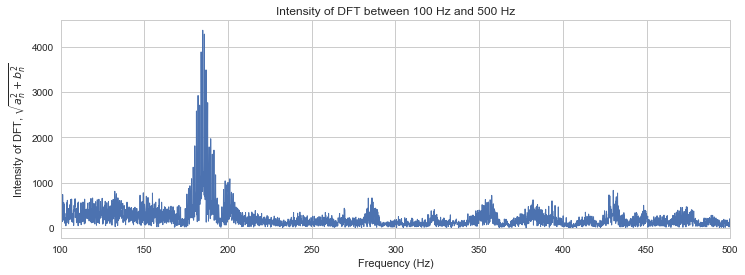

In [38]:
plot_dft_by_hz(freqs, a_n, b_n, 100, 500)

### Hmmm... The note F# is exactly 185 Hz, and G is exactly 196 Hz. Lets listen to those tones...

In [40]:
F_sharp_freq = 185.0
G_freq = 196.0

t = np.linspace(0, 1.0, sr)
F_sharp_tone = 0.5 * np.sin(2 * math.pi * F_sharp_freq * t)
G_tone = 0.5 * np.sin(2 * math.pi * G_freq * t)

ipd.Audio(G_tone, rate=sr)

In [41]:
ipd.Audio(ac_dc, rate=sr)

## Lets try a more tonal sound

Sample rate of our sound: 48000


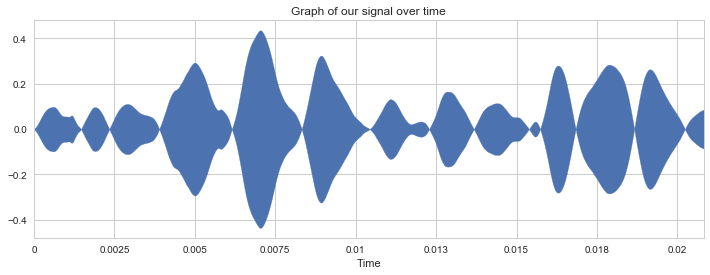

In [46]:
rhodes, sr_rhodes = librosa.load('audio/rhodes.wav', sr=48000)

print('Sample rate of our sound: ' + str(sr_rhodes))

plt.figure(figsize=(12, 4))
librosa.display.waveplot(rhodes[5000: 6000], sr=sr_rhodes)
plt.title('Graph of our signal over time')
plt.show()

ipd.Audio(rhodes, rate=sr_rhodes)

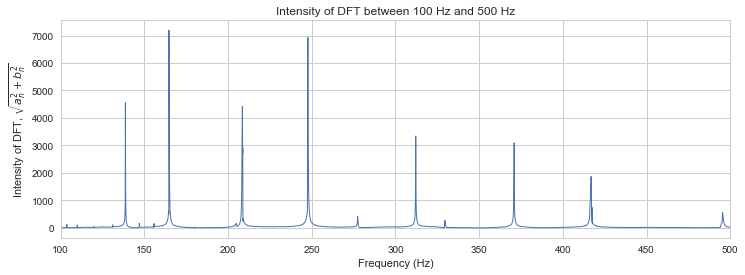

In [47]:
# Do the DFT!
a_n_rhodes, b_n_rhodes = dft(rhodes)
freqs_rhodes = (sr_rhodes / 2) * np.arange(0.0, 1.0, 2.0/len(rhodes))

plot_dft_by_hz(freqs_rhodes, a_n_rhodes, b_n_rhodes, 100, 500)

The peaks are at about 139 Hz, 165 Hz, 207 Hz, 247 Hz

C# is 138.59 Hz, E is 164.81 Hz, G# is 207.65 Hz, B is 246.94 Hz. 

__So this is a C# minor 7th chord.__

## Filtering - setting DFT values to 0
### First we try a "high pass filter"

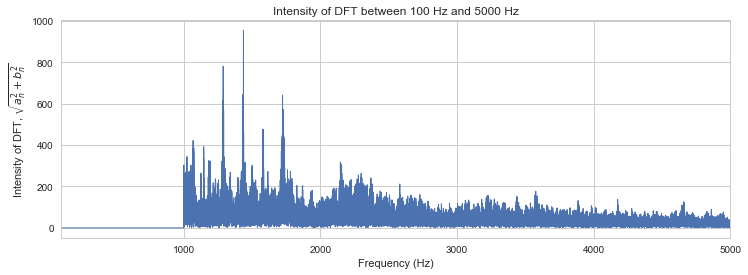

In [48]:
a_n_hp, b_n_hp = dft(ac_dc)

a_n_hp[freqs < 1000.0] = 0
b_n_hp[freqs < 1000.0] = 0

plot_dft_by_hz(freqs, a_n_hp, b_n_hp, 100, 5000)

In [49]:
ac_dc_hp = inverse_dft(a_n_hp, b_n_hp)
ipd.Audio(ac_dc_hp, rate=sr)

### Now a "low pass filter"

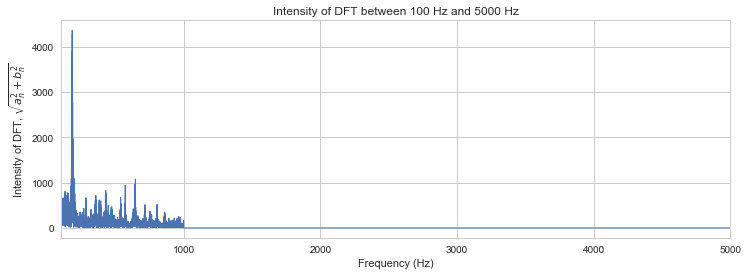

In [50]:
a_n_lp, b_n_lp = dft(ac_dc)

a_n_lp[freqs > 1000.0] = 0
b_n_lp[freqs > 1000.0] = 0

plot_dft_by_hz(freqs, a_n_lp, b_n_lp, 100, 5000)

In [51]:
ac_dc_lp = inverse_dft(a_n_lp, b_n_lp)
ipd.Audio(ac_dc_lp, rate=sr)

### How does the filtered signal look compared to the other signal? 

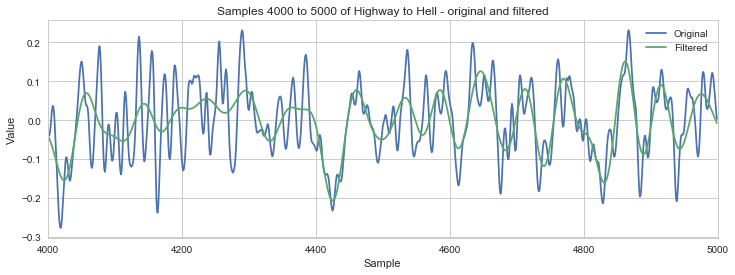

In [52]:
n0=4000
n1=5000

plt.figure(figsize=(12, 4))
plt.plot(range(n0,n1), ac_dc[n0:n1], label='Original') # ac_dc[0:100] selects the array elements from 0 to 100
plt.plot(range(n0,n1), ac_dc_lp[n0:n1], label='Filtered') # ac_dc[0:100] selects the array elements from 0 to 100
plt.xlabel('Sample')
plt.xlim([n0,n1])
plt.ylabel('Value')
plt.title('Samples {0} to {1} of Highway to Hell - original and filtered'.format(n0, n1))
plt.legend()
plt.show()

### Finally a band-pass filter

In [55]:
a_n_bp, b_n_bp = dft(ac_dc)

a_n_bp[(freqs > 500) & (freqs < 1000.0)] = 0
b_n_bp[(freqs > 500) & (freqs < 1000.0)] = 0

ac_dc_bp = inverse_dft(a_n_bp, b_n_bp)
ipd.Audio(ac_dc_bp, rate=sr)

# Home-made mp3 Compression

What if we discarded all the values of the Fourier transform that were close enough to 0, and kept only the larger values?

E.g. if we had

|$a_0$ | $a_1$ | $a_2$ | $a_3$ | $a_4$ | $a_5$ | $a_6$ | $a_7$ | $\ldots$ | 
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
| 0.8 | -0.05 | 0.5 | 0.09 | -0.93 | 0.77 | -0.01 | 0.02|

If we only stored values that had absolute value larger than 0.1 (and their corresponding indices)

|$a_0$  | $a_2$ | $a_4$ | $a_5$ | | $\ldots$ | 
|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|:-:|
| 0.8 | 0.5 | -0.93 | 0.77 | 

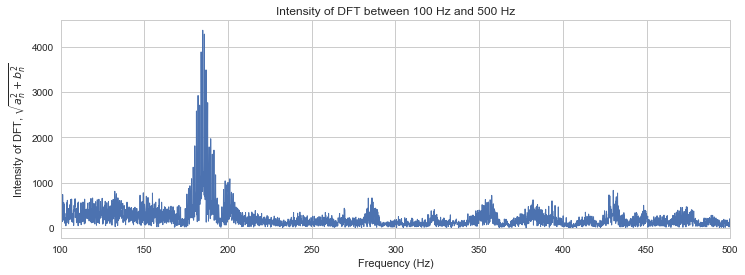

In [56]:
plot_dft_by_hz(freqs, a_n, b_n, 100, 500)
ac_dc_recon = inverse_dft(a_n, b_n)
ipd.Audio(ac_dc_recon, rate=sr)

### Now lets "compress" the signal by setting $a_n=0$ and $b_n=0$ if $\sqrt{a_n^2 + b_n^2}$ is smaller than some threshold
The threshold here, called ```cutoff_height``` is set to 
$$
\texttt{cutoff_height} = 0.05 \times \max_{0 \le n < N} \sqrt{a_n^2 + b_n^2}
$$
We can play with the value of 0.05 to see different results. Larger values will remove more components and hence compress more. Smaller values will compress less.

Compressed / cutoff DFT
File size would be about 2.3821% of original


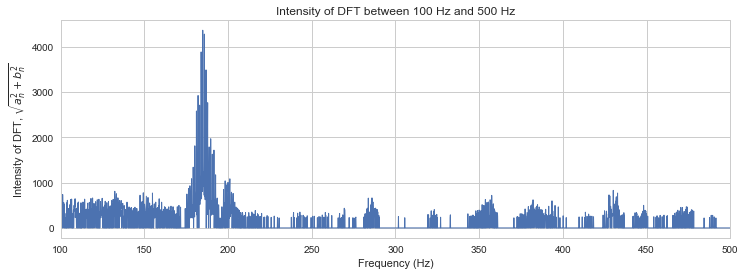

In [60]:
dft_int = np.sqrt(a_n**2 + b_n**2)

cutoff_height = max(dft_int) * 0.05

a_n_comp = np.copy(a_n)
b_n_comp = np.copy(b_n)
a_n_comp[dft_int < cutoff_height] = 0
b_n_comp[dft_int < cutoff_height] = 0

print('Compressed / cutoff DFT')
print('File size would be about {0}% of original'.format(round(2*100*sum(dft_int > cutoff_height) / len(dft_int),4)))
plot_dft_by_hz(freqs, a_n_comp, b_n_comp, 100, 500)

ac_dc_comp = inverse_dft(a_n_comp, b_n_comp)
ipd.Audio(ac_dc_comp, rate=sr)

# Images and blurring

Just as sounds are signals, so are images.

Image size (in pixels): (667, 1000)


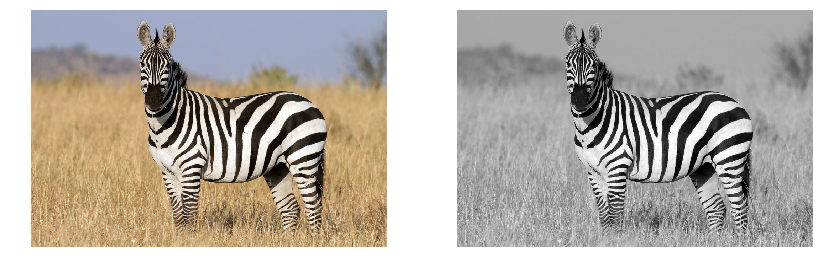

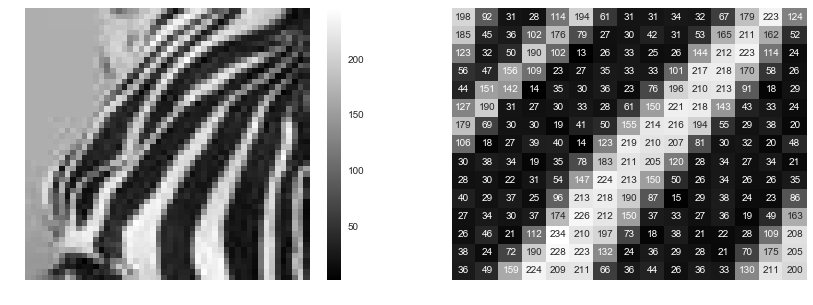

In [61]:
zebra = plt.imread('img/zebra.jpg')

def rgb2gray(rgb):
    return np.int32(np.dot(rgb[...,:3], [0.299, 0.587, 0.114]))

zeb_bw = rgb2gray(zebra)
print('Image size (in pixels):', zeb_bw.shape)

fig = plt.figure(figsize=(14, 5))
fig.add_subplot(1,2,1)
plt.imshow(zebra)
plt.axis('off')

fig.add_subplot(1,2,2)
plt.imshow(zeb_bw, cmap=plt.cm.gray)
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(14, 5))
fig.add_subplot(1,2,1)
sns.heatmap(zeb_bw[100:150, 300:350], cmap=plt.cm.gray)
plt.axis('off')

fig.add_subplot(1,2,2)
sns.heatmap(zeb_bw[120:135, 320:335], annot=True, cmap=plt.cm.gray, cbar=False, fmt='d')
plt.axis('off')

plt.show()

# The discrete Fourier transform in two dimensions

Now we have an image of size $N\times M$ with two indices, we write $\,\large\color{red}{f_{k,\ell}}$, where $k$ goes between $0$ and $N-1$, and $\ell$ between $0$ and $M-1$.

And we are going to obtain discrete Fourier coefficients that have __two indices__, $\,\large\color{blue}{a_{n,m}}$ and $\,\large\color{blue}{b_{n,m}}$

$$
\large
\color{red}{f_{k,\ell}} \,=\, \sum_{n=0}^{N-1} \sum_{m=0}^{M-1} \,\color{blue}{a_{n,m}} \cos\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right) \right) + \color{blue}{b_{n,m}} \, \sin\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right) \right)
$$
where we calculate the coefficients $\color{blue}{a_n}$ and $\color{blue}{b_n}$ using
$$
\large
\begin{aligned}
\color{blue}{a_{n,m}} \,=\, \frac{1}{MN} \sum_{k=0}^{N-1} \, \color{red}{f_{k,\ell}} \, \cos\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right) \right) \\
\color{blue}{b_{n,m}} \,=\, \frac{1}{MN} \sum_{k=0}^{N-1} \, \color{red}{f_{k,\ell}} \, \sin\left(2 \pi \left(\frac{k n}{N} + \frac{\ell m}{M}\right)\right) 
\end{aligned}
$$

Lets plot some examples of the sines and cosines in 2D

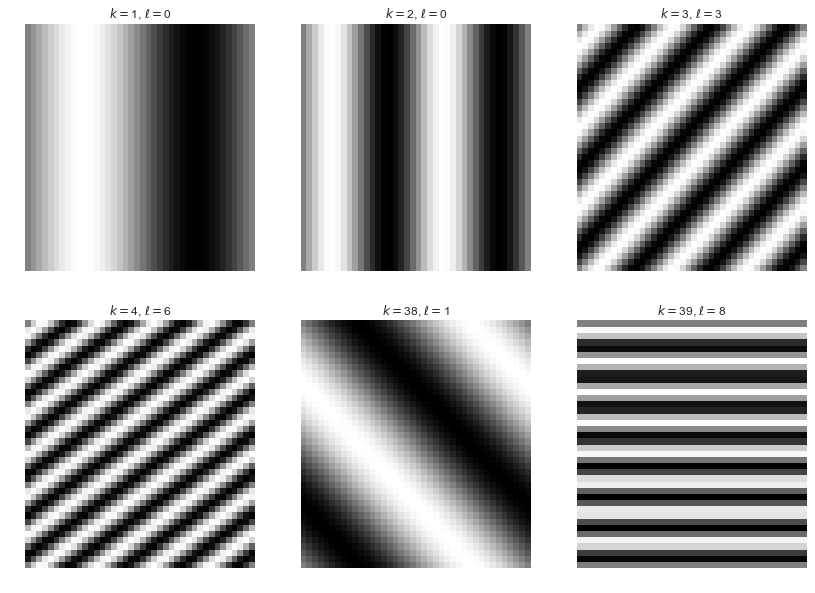

In [62]:
N, M = (40, 40)

x, y = np.meshgrid(np.linspace(0, 1, M), np.linspace(0, 1, N))

fig = plt.figure(figsize=(14, 10))
kls = [[1,0], [2,0], [3,3], [4,6], [38, 1], [39,8]]
for i,(k,l) in enumerate(kls):
    fig.add_subplot(2,3,i+1)
    sns.heatmap(np.sin(2*math.pi*(k*x + l*y)), cmap=plt.cm.gray, cbar=False)
    plt.title(r'$k=${0}, $\ell=${1}'.format(k,l))
    plt.axis('off')

plt.show()

In [63]:
def dft2(signal):
    # the signal is the f_k
    ft = scipy.fftpack.fft2(signal)

    a_nm = np.real(ft)
    b_nm = np.imag(ft)

    return a_nm, b_nm
    
def inverse_dft2(a_nm, b_nm):
    ft = np.vectorize(complex)(a_nm, b_nm)
    
    signal = np.real(scipy.fftpack.ifft2(ft))
    return signal

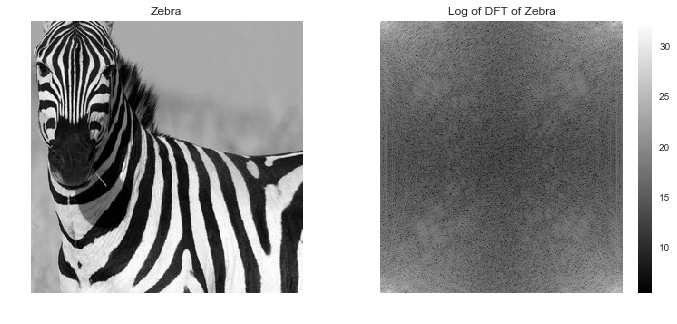

In [64]:
z = zeb_bw[100:400, 300:600]

(N,M) = z.shape

a_mn, b_mn = dft2(z)

fig = plt.figure(figsize=(12, 5))
fig.add_subplot(1,2,1)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Zebra')
plt.axis('off')

fig.add_subplot(1,2,2)
sns.heatmap(np.log(a_mn**2 + b_mn**2), cmap=plt.cm.gray)
plt.title('Log of DFT of Zebra')
plt.axis('off')
plt.show()

### First we try a "low pass" filter

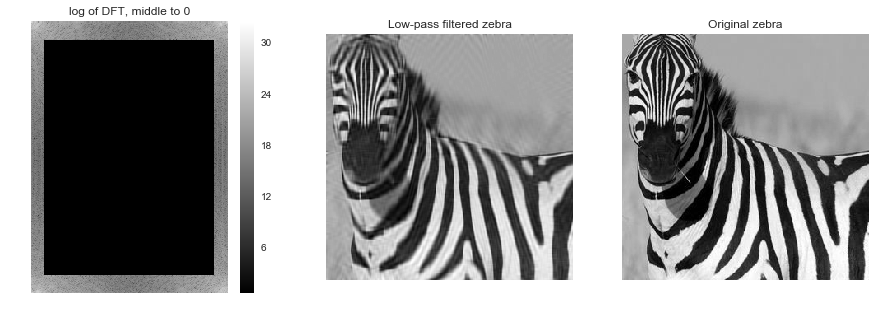

In [65]:
a_mn_lp = np.copy(a_mn)
b_mn_lp = np.copy(b_mn)

e = 20
a_mn_lp[e:-e, e:-e] = 1
b_mn_lp[e:-e, e:-e] = 1

z_lp = inverse_dft2(a_mn_lp, b_mn_lp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_lp**2 + b_mn_lp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_lp, cmap=plt.cm.gray)
plt.title('Low-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()

Note above how much information we remove yet retain the recognizable image of a zebra!

### Now a "high pass" filter

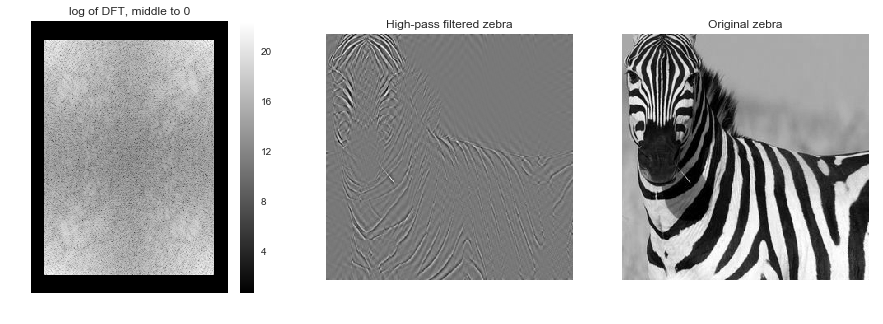

In [66]:
a_mn_hp = np.copy(a_mn)
b_mn_hp = np.copy(b_mn)

a_mn_hp[:e,:] = a_mn_hp[-e:,:] = a_mn_hp[:,:e] = a_mn_hp[:,-e:] = 1
b_mn_hp[:e,:] = b_mn_hp[-e:,:] = b_mn_hp[:,:e] = b_mn_hp[:,-e:] = 1

z_hp = inverse_dft2(a_mn_hp, b_mn_hp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_hp**2 + b_mn_hp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_hp, cmap=plt.cm.gray)
plt.title('High-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()

### Now a low-pass filter, but removing the middle circle of radius $r$, rather than a square

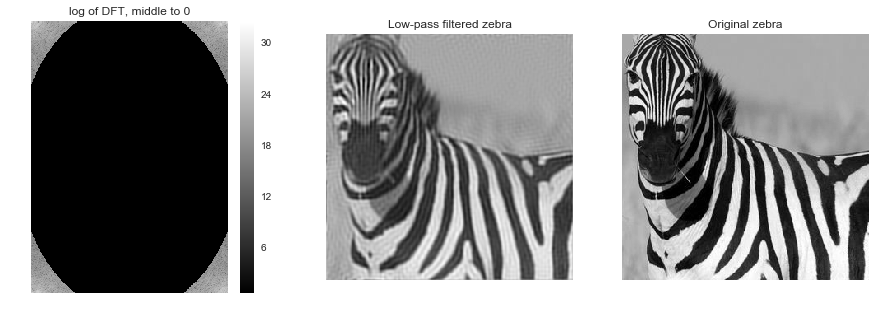

In [67]:
a_mn_lp = np.copy(a_mn)
b_mn_lp = np.copy(b_mn)

r = 170
y,x = np.ogrid[-N/2:N/2, -M/2:M/2]
mask = x*x + y*y <= r*r

a_mn_lp[mask] = 1
b_mn_lp[mask] = 1

z_lp = inverse_dft2(a_mn_lp, b_mn_lp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_lp**2 + b_mn_lp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_lp, cmap=plt.cm.gray)
plt.title('Low-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()

### ...and the same for a high-pass

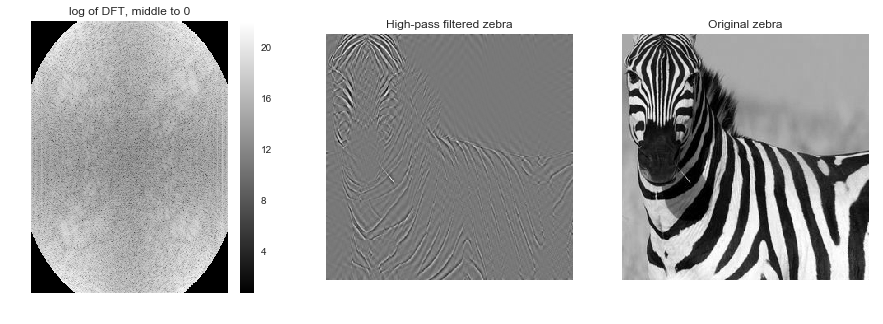

In [68]:
a_mn_hp = np.copy(a_mn)
b_mn_hp = np.copy(b_mn)

r = 170
y,x = np.ogrid[-N/2:N/2, -M/2:M/2]
mask = x*x + y*y <= r*r

a_mn_hp[~mask] = 1
b_mn_hp[~mask] = 1

z_lp = inverse_dft2(a_mn_hp, b_mn_hp)

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1,3,1)
sns.heatmap(np.log(a_mn_hp**2 + b_mn_hp**2), cmap=plt.cm.gray)
plt.title('log of DFT, middle to 0')
plt.axis('off')

fig.add_subplot(1,3,2)
plt.imshow(z_hp, cmap=plt.cm.gray)
plt.title('High-pass filtered zebra')
plt.axis('off')

fig.add_subplot(1,3,3)
plt.imshow(z, cmap=plt.cm.gray)
plt.title('Original zebra')
plt.axis('off')

plt.show()